In [1]:
import numpy as np
import graphviz.backend as be
from sklearn.datasets import *
from dtreeviz import model
from sklearn import tree


In [2]:
clas = tree.DecisionTreeClassifier()  
iris = load_iris()

X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


[Text(0.5, 0.9166666666666666, 'x[2] <= 2.45\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.4230769230769231, 0.75, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.46153846153846156, 0.8333333333333333, 'True  '),
 Text(0.5769230769230769, 0.75, 'x[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.5384615384615384, 0.8333333333333333, '  False'),
 Text(0.3076923076923077, 0.5833333333333334, 'x[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.15384615384615385, 0.4166666666666667, 'x[3] <= 1.65\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(0.07692307692307693, 0.25, 'gini = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(0.23076923076923078, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.46153846153846156, 0.4166666666666667, 'x[3] <= 1.55\ngini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(0.38461538461538464, 0.25, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(0.5384615384615384, 0.25, 

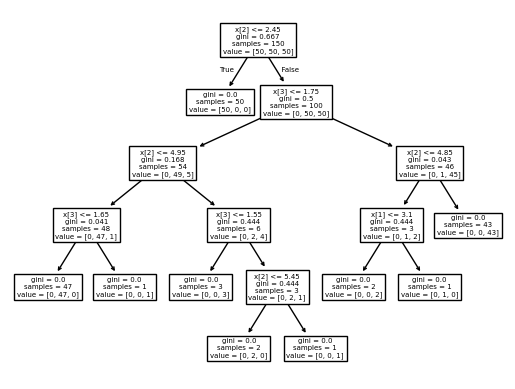

In [3]:
from sklearn.tree import plot_tree
plot_tree(clas)

Classification

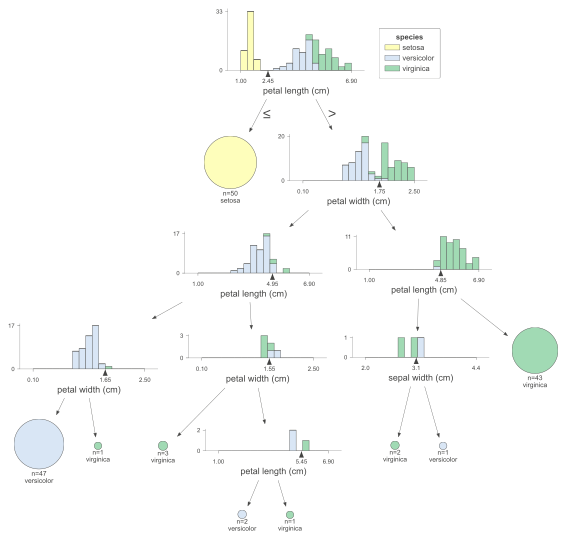

In [4]:
viz_model = model(
    clas,
    X_train=X_train,
    y_train=y_train,
    feature_names=iris.feature_names,
    target_name="species",
    class_names=["setosa", "versicolor", "virginica"]
)

viz = viz_model.view()
viz

Regression

In [5]:
regr = tree.DecisionTreeRegressor()
diab = load_diabetes()
X_train1 = diab.data
y_train1 = diab.target

regr.fit(X_train1, y_train1)

viz_model = model(
    regr,
    X_train=X_train1,
    y_train=y_train1,
    feature_names=diab.feature_names,
    target_name="disease progression",
    class_names=None
) 
viz = viz_model.view()
viz

Same thing using sklearn.

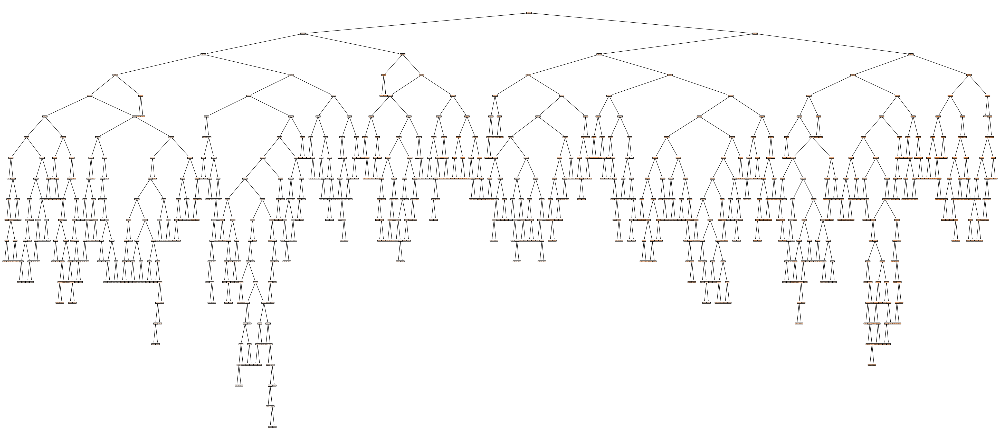

In [6]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(50, 22))
plot_tree(
    regr,
    feature_names=diab.feature_names,
    filled=True,
    rounded=True
)
plt.show()

Horizontal decision tree

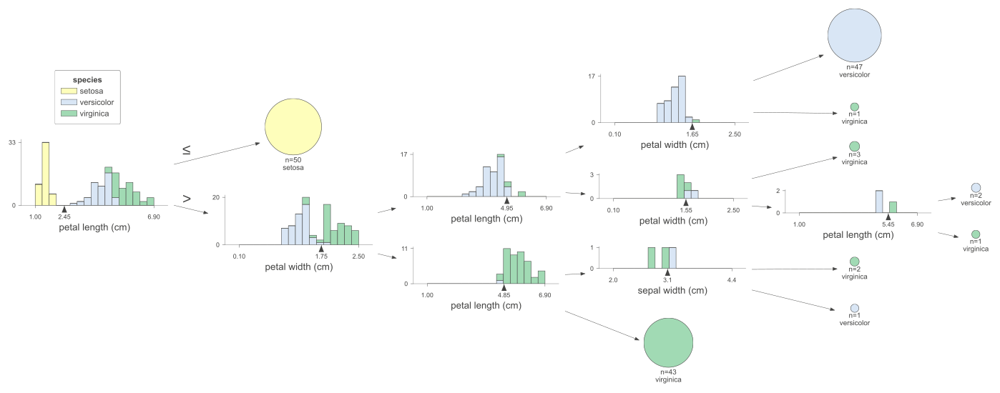

In [7]:
from dtreeviz import model

viz_model = model(
    clas,
    X_train=X_train,
    y_train=y_train,
    feature_names=iris.feature_names,
    target_name="species",
    class_names=list(iris.target_names)
)

viz_model.view(
    orientation="LR",
    scale=1.5
)

Predicting path

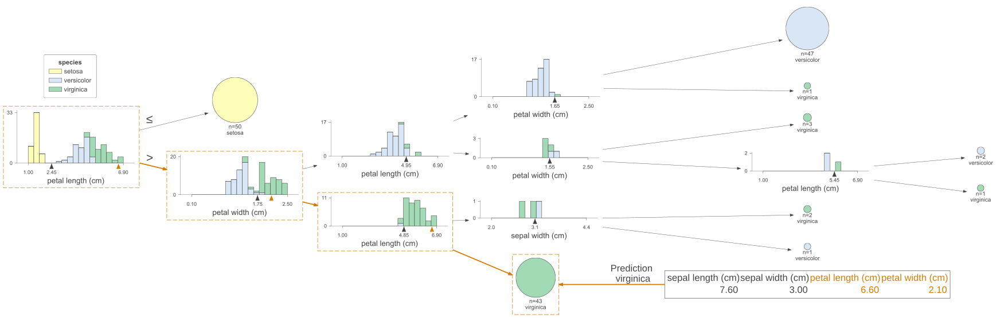

In [8]:
X = iris.data[np.random.randint(0, len(iris.data)),:]
viz_model = model(
    clas,
    X_train=X_train,
    y_train=y_train,
    feature_names=iris.feature_names,
    target_name="species",
    class_names=list(iris.target_names),
)

viz_model.view(
    x=X,
    orientation="LR",
    scale=1.5,
    # show_just_path=True # Just show the path for the given X
)

In [9]:
X

array([7.6, 3. , 6.6, 2.1])

Node number

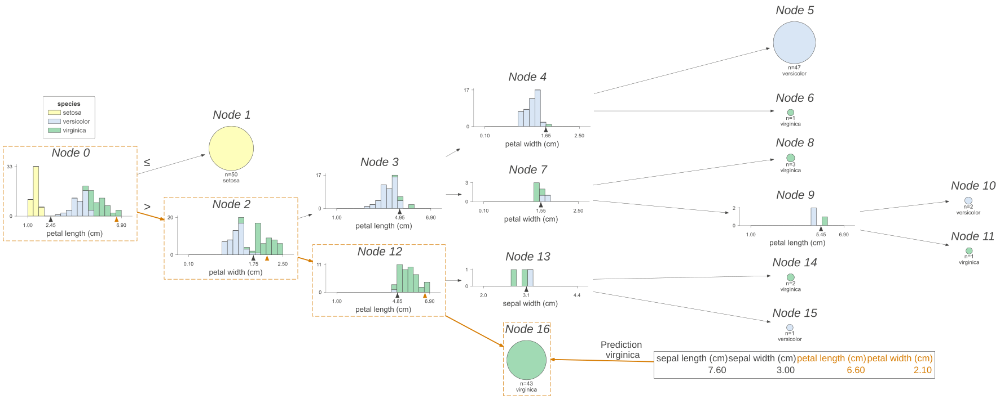

In [10]:
viz_model = model(
    clas,
    X_train=X_train,
    y_train=y_train,
    feature_names=iris.feature_names,
    target_name="species",
    class_names=list(iris.target_names),
)

viz_model.view(
    x=X,
    orientation="LR",
    scale=1.5,
    show_node_labels=True
)

Without graphs

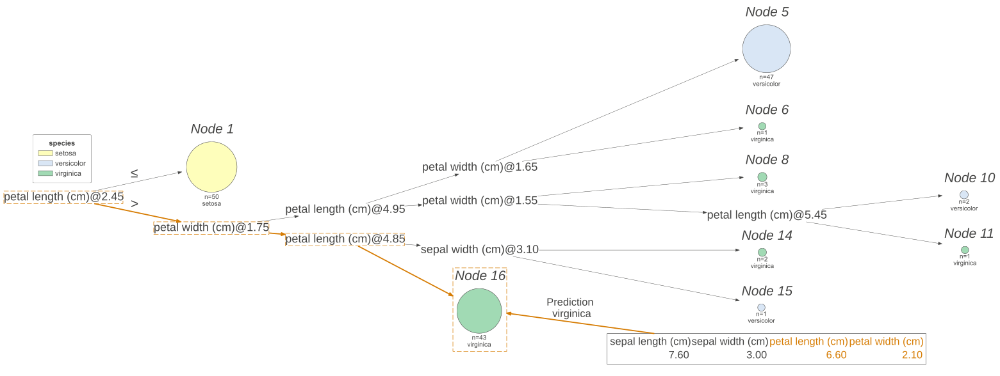

In [11]:
viz_model = model(
    clas,
    X_train=X_train,
    y_train=y_train,
    feature_names=iris.feature_names,
    target_name="species",
    class_names=list(iris.target_names),
)

viz_model.view(
    x=X,
    orientation="LR",
    scale=1.5,
    show_node_labels=True,
    fancy=False
)

Path in english

In [12]:
from dtreeviz.trees import ShadowDecTree, explain_prediction_plain_english
shadow_tree = ShadowDecTree.get_shadow_tree(
    clas,
    X_train,
    y_train,
    feature_names=iris.feature_names,
    target_name="species"
)


print(
    explain_prediction_plain_english(
        shadow_tree,
        X
    )
)

4.85 <= petal length (cm) 
1.75 <= petal width (cm) 



Feature importance

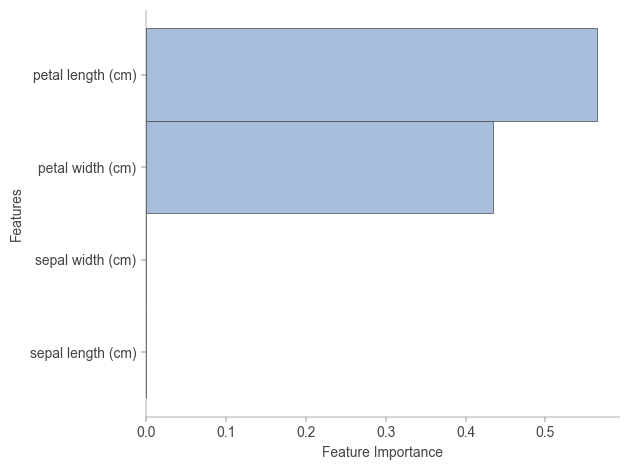

None


In [13]:
from dtreeviz.trees import ShadowDecTree, explain_prediction_sklearn_default

print(explain_prediction_sklearn_default(shadow_tree, X))

Univariate Regression.

In [14]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from dtreeviz import model

df_cars = pd.read_csv("Datasets/car.csv")

X = df_cars[["WGT"]]
y = df_cars["MPG"]

dt = DecisionTreeRegressor(
    max_depth=3,
    criterion="squared_error"
)

dt.fit(X, y)

viz_model = model(
    dt,
    X_train=X,
    y_train=y,
    feature_names=["WGT"],
    target_name="MPG"
)

viz = viz_model.view()
viz.show()

/home/hardik/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


3D Regression.

In [ ]:
from sklearn.tree import DecisionTreeRegressor
import dtreeviz

X = df_cars[['WGT', 'ENG']]
y = df_cars['MPG']

dt = DecisionTreeRegressor(
    max_depth=3,
    criterion="absolute_error",
    random_state=42
)

dt.fit(X, y)

viz_model = dtreeviz.model(
    dt,
    X_train=X,
    y_train=y,
    feature_names=['Vehicle Weight', 'Horse Power'],
    target_name='MPG'
)

viz_model.view().show()


/home/hardik/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



(eog:34487): EOG-CRITICAL **: 16:39:43.614: eog_image_get_file: assertion 'EOG_IS_IMAGE (img)' failed

(eog:34487): GLib-GIO-CRITICAL **: 16:39:43.614: g_file_equal: assertion 'G_IS_FILE (file1)' failed

(eog:34487): EOG-CRITICAL **: 16:39:43.614: eog_image_get_file: assertion 'EOG_IS_IMAGE (img)' failed

(eog:34487): GLib-GIO-CRITICAL **: 16:39:43.614: g_file_equal: assertion 'G_IS_FILE (file1)' failed

(eog:34487): GLib-GObject-CRITICAL **: 18:03:13.538: g_object_unref: assertion 'G_IS_OBJECT (object)' failed

(eog:34487): EOG-WARNING **: 18:03:13.538: Error when getting information for file “/tmp/.org.chromium.Chromium.C8dhSt”: No such file or directory

(eog:34487): GLib-GObject-CRITICAL **: 18:03:13.538: g_object_unref: assertion 'G_IS_OBJECT (object)' failed

(eog:34487): EOG-WARNING **: 18:03:13.538: Error when getting information for file “/tmp/.org.chromium.Chromium.C8dhSt”: No such file or directory


/home/hardik/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


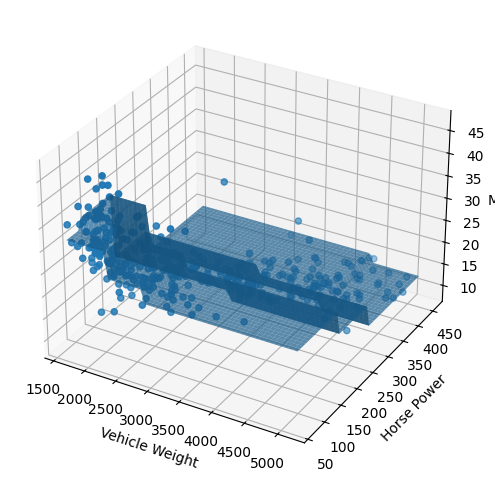

In [19]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

x1 = np.linspace(X['WGT'].min(), X['WGT'].max(), 50)
x2 = np.linspace(X['ENG'].min(), X['ENG'].max(), 50)

xx, yy = np.meshgrid(x1, x2)

zz = dt.predict(
    np.c_[xx.ravel(), yy.ravel()]
).reshape(xx.shape)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

ax.plot_surface(xx, yy, zz, alpha=0.7)
ax.scatter(
    X['WGT'],
    X['ENG'],
    y
)

ax.set_xlabel('Vehicle Weight')
ax.set_ylabel('Horse Power')
ax.set_zlabel('MPG')

plt.show()